In [1]:
### Download libraries

import os

# Download packages

from PIL import Image
import imageio

from matplotlib import pyplot as plt
#from skimage.color import rgb2gray
import scipy.ndimage as ndi 
import numpy as np
import pandas as pd

import skimage
from skimage.transform import rescale
from skimage.filters import threshold_otsu
from skimage.transform import resize
from skimage import io, morphology

plt.rcParams['figure.dpi'] = 1000
plt.rcParams['savefig.dpi'] = 1000

In [83]:
### Input files --- 
input_dir = 'Feria'
seg_dir = 'Seg'
out_dir = 'Output'
lab_dir = 'Label'

In [84]:
# Files in input directory
lab_loc = os.listdir(lab_dir)
lab_loc
#lab_file = os.path.join(lab_dir, lab_loc[1])

['label.txt', 'pixel_count.txt', 'sum_table.txt', '.DS_Store', 'Log.txt']

In [121]:
# Functions
def read_tiff(path):
    """
    path - Path to the multipage-tiff file
    """
    img = Image.open(path)
    images = []
    for i in range(img.n_frames):
        img.seek(i)
        images.append(np.array(img))
    return np.array(images)



def cleaning_hole(image) : 
    thresh =  np.median(image)
    
    binary = np.where(image >=thresh, 1, 0)
    #mask_thresh = ndi.binary_dilation(mask_thresh, iterations = 5)
    #mask_thresh = ndi.binary_closing(mask_thresh, iterations = 5)
    #binary = ndi.median_filter(binary, 10)
    #binary = skimage.morphology.closing(binary)

    return binary

def sharpen_sig(image, alpha = 30) : 
    blurred_f = ndi.gaussian_filter(image, 3)
    filter_blurred_f = ndi.gaussian_filter(blurred_f, 1)
    
    sharpened = blurred_f + alpha * (blurred_f - filter_blurred_f)
    
    return sharpened

def rgb2gray(rgb):

    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b

    return gray

In [122]:
lab_file = os.path.join(lab_dir, lab_loc[1])

In [144]:
### Download iamges

tiff_dapi = read_tiff('Feria/[20456841_Scan1_Core[1,2,B]_[15665,38196]_component_data]_DAPI-2.tif')
tiff_480 = read_tiff('Feria/[20456841_Scan1_Core[1,2,B]_[15665,38196]_component_data]_480-2.tif')
tiff_520 = read_tiff('Feria/[20456841_Scan1_Core[1,2,B]_[15665,38196]_component_data]_520-2.tif')
tiff_570 = read_tiff('Feria/[20456841_Scan1_Core[1,2,B]_[15665,38196]_component_data]_570-2.tif')
tiff_620 = read_tiff('Feria/[20456841_Scan1_Core[1,2,B]_[15665,38196]_component_data]_620-2.tif')
tiff_690 = read_tiff('Feria/[20456841_Scan1_Core[1,2,B]_[15665,38196]_component_data]_690-2.tif')
tiff_780 = read_tiff('Feria/[20456841_Scan1_Core[1,2,B]_[15665,38196]_component_data]_780-2.tif')

# Main image object
img_obj = {}


In [145]:
# Import images to object

img_set = {'DAPI': tiff_dapi, 
           '480': tiff_480, 
           '520': tiff_520, 
           '570': tiff_570, 
           '620': tiff_620, 
           '690': tiff_690, 
           '780': tiff_780}

img_obj['raw'] = img_set.copy()


In [146]:
raw_img = img_set.copy()

raw_img['480'].shape
ToCleanImage = ['480', '520', '570', '620', '690', '780']

for img in ToCleanImage: 
    raw_img[img].shape = (raw_img[img].shape[1],raw_img[img].shape[2],raw_img[img].shape[3])
    raw_img[img] = rgb2gray(raw_img[img])
    #raw_img[img] = sharpen_sig(raw_img[img])
    #raw_img[img] = cleaning_hole(raw_img[img])



raw_img['DAPI'].shape = (raw_img['DAPI'].shape[1], raw_img['DAPI'].shape[2])     
#raw_img['DAPI'] = sharpen_sig(raw_img['DAPI'])
raw_img['DAPI'] = cleaning_hole(raw_img['DAPI'])

# Add to image object
img_obj['QC'] = raw_img.copy()





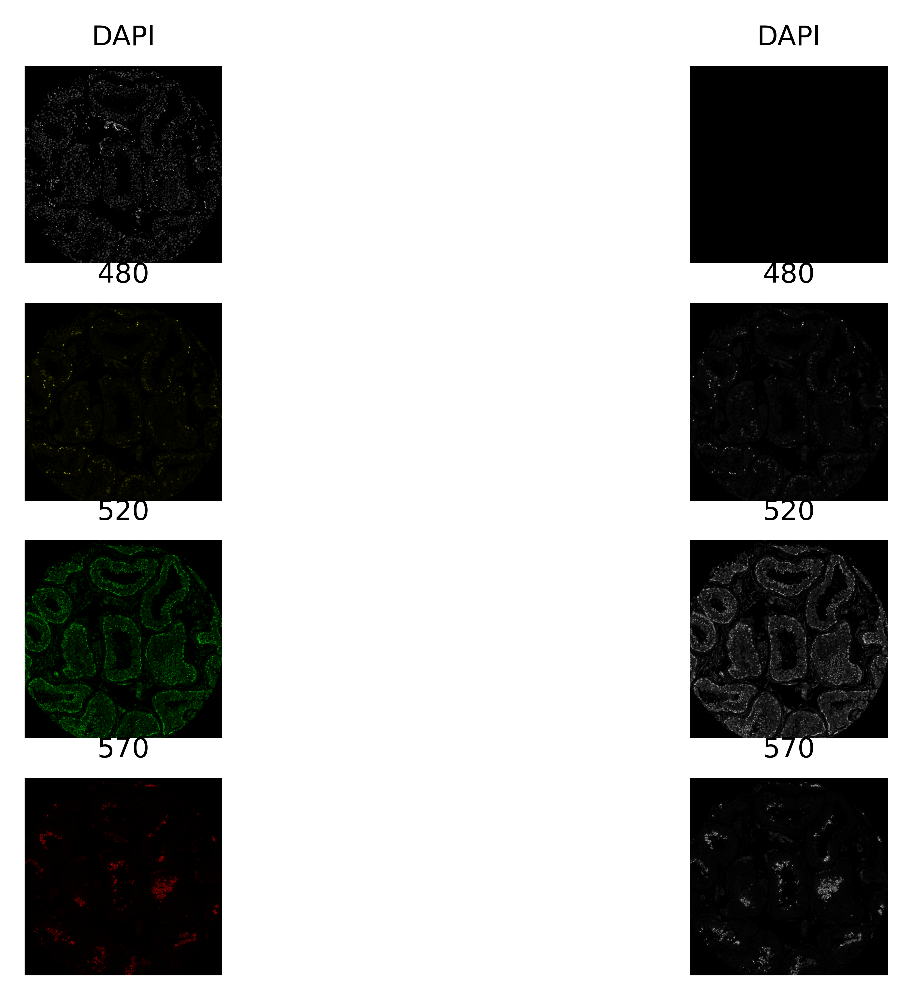

In [147]:
fig, axes = plt.subplots(4,2)
axes[0,0].imshow(img_set['DAPI'], cmap = 'gray')
axes[0,0].axis('off')
axes[0,0].set_title('DAPI', fontsize=8)
axes[0,1].imshow(raw_img['DAPI'], cmap = 'gray')
axes[0,1].axis('off')
axes[0,1].set_title('DAPI', fontsize=8)
axes[1,0].imshow(img_set['480'], cmap = 'gray')
axes[1,0].axis('off')
axes[1,0].set_title('480', fontsize=8)
axes[1,1].imshow(raw_img['480'], cmap = 'gray')
axes[1,1].axis('off')
axes[1,1].set_title('480', fontsize=8)
axes[2,0].imshow(img_set['520'], cmap = 'gray')
axes[2,0].axis('off')
axes[2,0].set_title('520', fontsize=8)
axes[2,1].imshow(raw_img['520'], cmap = 'gray')
axes[2,1].axis('off')
axes[2,1].set_title('520', fontsize=8)
axes[3,0].imshow(img_set['570'], cmap = 'gray')
axes[3,0].axis('off')
axes[3,0].set_title('570', fontsize=8)
axes[3,1].imshow(raw_img['570'], cmap = 'gray')
axes[3,1].axis('off')
axes[3,1].set_title('570', fontsize=8)
axes[3,0].imshow(img_set['570'], cmap = 'gray')
axes[3,0].axis('off')
axes[3,0].set_title('570', fontsize=8)
axes[3,1].imshow(raw_img['570'], cmap = 'gray')
axes[3,1].axis('off')
axes[3,1].set_title('570', fontsize=8)
plt.savefig('Output/overview.tif', dpi= 1000)

In [10]:
### Don't forget to clean up DAPI channel !!!!

In [11]:
label_table = pd.read_csv('Label/label.txt').astype(int)
sum_table = pd.read_csv('Label/sum_table.txt')

label_size = img_obj['QC']['DAPI'].shape
labels = np.zeros(label_size)

In [12]:
label_table.shape

(769308, 3)

In [13]:
label_size

(2198, 2198)

In [14]:
label_table= label_table[(label_table['Ycor'] > 0) & (label_table['Xcor'] > 0)]

In [15]:
max(label_table['Ycor'])

2198

In [16]:
#labels

for row in label_table.index:
    labels[row['Ycor'], row['Xcor']] = row['cellno']


TypeError: 'int' object is not subscriptable

In [301]:
label_table.index

RangeIndex(start=0, stop=769980, step=1)

(-106.7, 2306.7, 2306.05, -71.05000000000001)

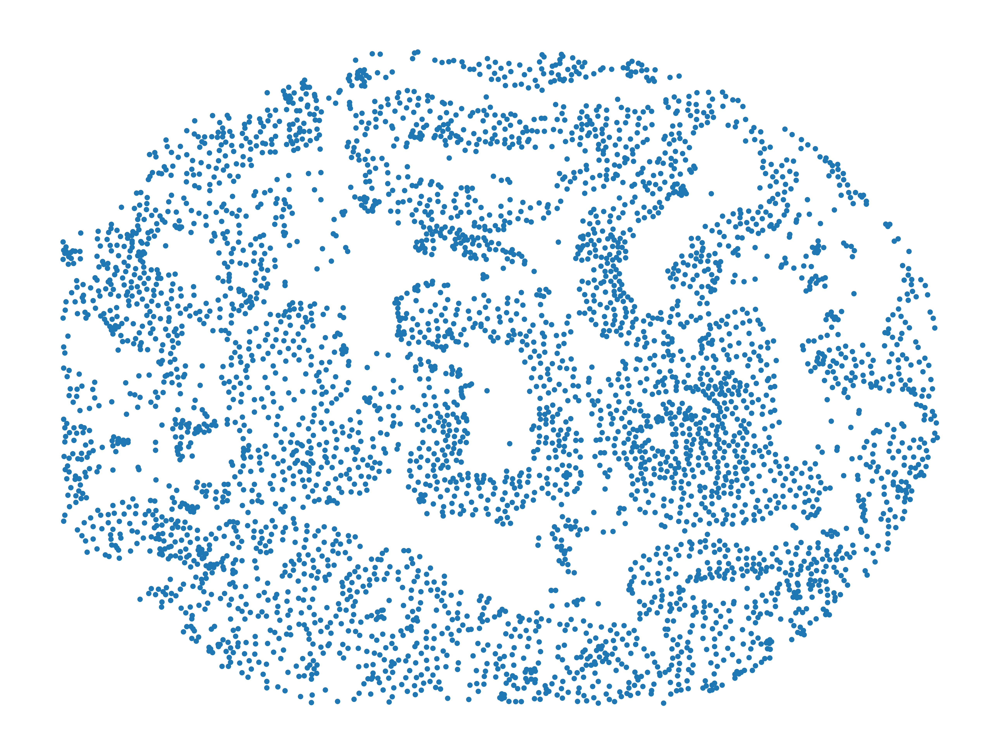

In [288]:
sum_table.plot.scatter(x = 'Xcor', y = 'Ycor', s = 1)
plt.gca().invert_yaxis()
plt.axis('off')


(-0.5, 2197.5, 2197.5, -0.5)

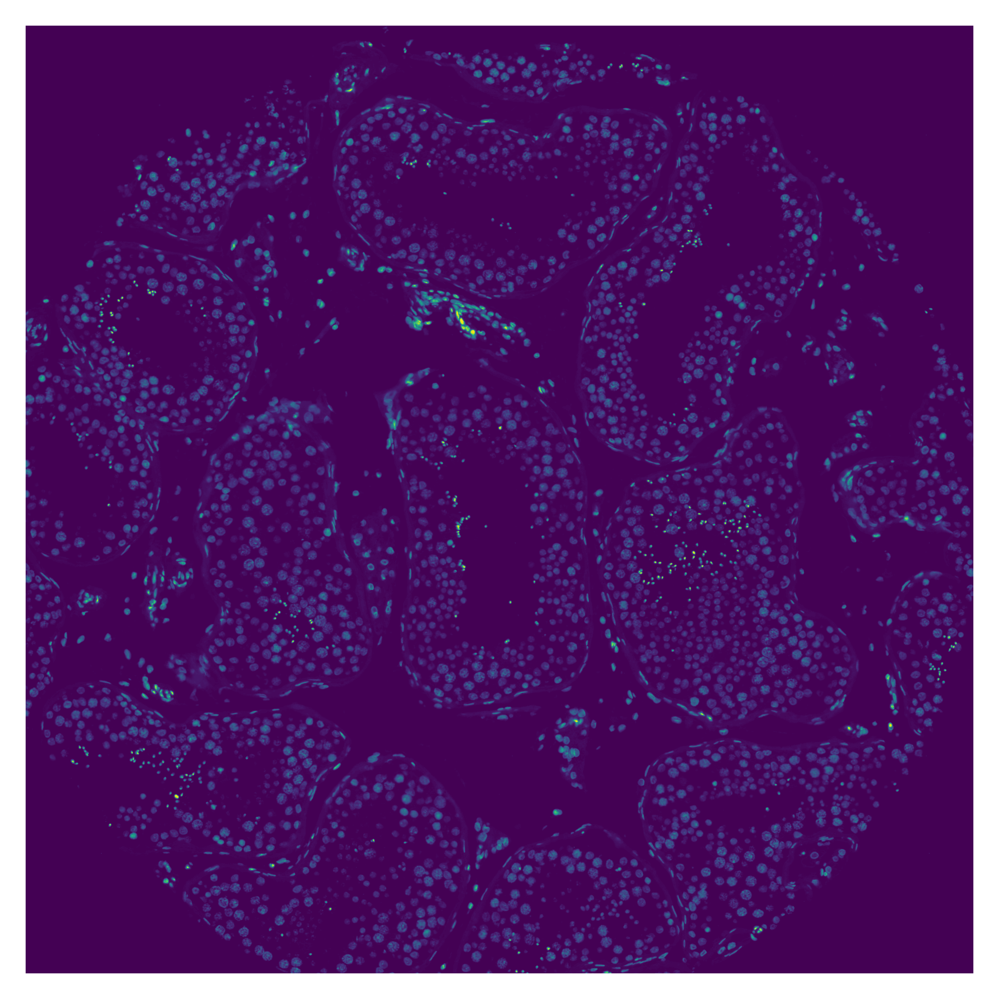

In [46]:
plt.imshow(img_obj['QC']['DAPI'])
plt.axis('off')

In [ ]:
len_val = 4000
for im in ['480', '520', '570', '620', '690', '780'] :
    data_mx = img_obj['QC'][im]
    sum_mx = np.zeros((len_val,), dtype = float)
    
    for label in range(1, len_val ):
                check_mx = np.where(labels == label, 1, 0)
                expression = check_mx * data_mx
                sum_mx[label] = np.sum(expression)
    ext_mx.append(sum_mx)